In [1]:
import numpy as np
import pandas as pd
import mlflow
from sklearn.preprocessing import LabelEncoder
import os
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
import joblib
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset
from sklearn.experimental import enable_halving_search_cv
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import HalvingRandomSearchCV, StratifiedKFold, cross_val_predict
from sklearn.metrics import fbeta_score, make_scorer, precision_score, recall_score, confusion_matrix, \
    ConfusionMatrixDisplay, roc_curve, auc

In [2]:
from joblib import Memory

cache_dir = 'E:\Projet_OC'
os.makedirs(cache_dir, exist_ok=True)
memory = Memory(cache_dir, verbose=0)

In [3]:
mlflow.set_experiment(experiment_id="0")

mlflow.autolog()
mlflow.set_tracking_uri("http://localhost:5000")

2025/04/19 12:15:58 INFO mlflow.tracking.fluent: Autologging successfully enabled for lightgbm.
2025/04/19 12:15:58 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2025/04/19 12:15:59 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.


In [4]:
# List files available
print(os.listdir("input/"))

['application_test.csv', 'application_train.csv']


In [5]:
# Training data
app_train = pd.read_csv('input/application_train.csv')
print('Training data shape: ', app_train.shape)
app_train.head()

Training data shape:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
# Testing data features
app_test = pd.read_csv('input/application_test.csv')
print('Testing data shape: ', app_test.shape)
app_test.head()

Testing data shape:  (48744, 121)


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
app_train['TARGET'].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

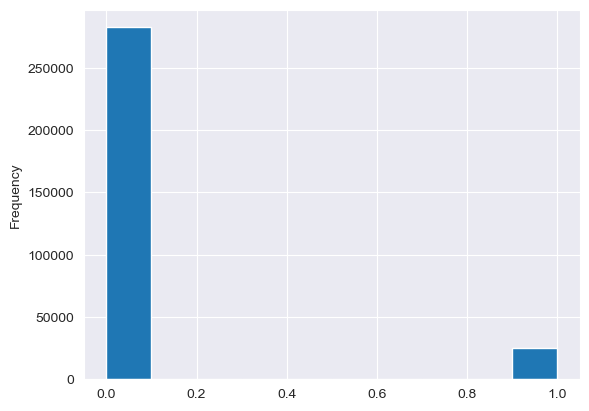

In [8]:
app_train['TARGET'].astype(int).plot.hist();

In [9]:
# Function to calculate missing values by column# Funct
def missing_values_table(df):
    # Total missing values
    mis_val = df.isnull().sum()

    # Percentage of missing values
    mis_val_percent = 100 * df.isnull().sum() / len(df)

    # Make a table with the results
    mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)

    # Rename the columns
    mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})

    # Sort the table by percentage of missing descending
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)

    # Print some summary information
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"
                                                               "There are " + str(mis_val_table_ren_columns.shape[0]) +
           " columns that have missing values.")

    # Return the dataframe with missing information
    return mis_val_table_ren_columns

In [10]:
# Missing values statistics
missing_values = missing_values_table(app_train)
missing_values.head(20)

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


In [11]:
# Number of each type of column
app_train.dtypes.value_counts()

float64    65
int64      41
object     16
Name: count, dtype: int64

In [12]:
# Number of unique classes in each object column
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

In [13]:
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in app_train:
    if app_train[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(app_train[col].unique())) <= 2:
            # Train on the training data
            le.fit(app_train[col])
            # Transform both training and testing data
            app_train[col] = le.transform(app_train[col])
            app_test[col] = le.transform(app_test[col])

            # Keep track of how many columns were label encoded
            le_count += 1

print('%d columns were label encoded.' % le_count)

3 columns were label encoded.


In [14]:
# one-hot encoding of categorical variables
app_train = pd.get_dummies(app_train)
app_test = pd.get_dummies(app_test)

print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 243)
Testing Features shape:  (48744, 239)


In [15]:
train_labels = app_train['TARGET']

# Align the training and testing data, keep only columns present in both dataframes
app_train, app_test = app_train.align(app_test, join = 'inner', axis = 1)

# Add the target back in
app_train['TARGET'] = train_labels

print('Training Features shape: ', app_train.shape)
print('Testing Features shape: ', app_test.shape)

Training Features shape:  (307511, 240)
Testing Features shape:  (48744, 239)


In [16]:
(app_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [17]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

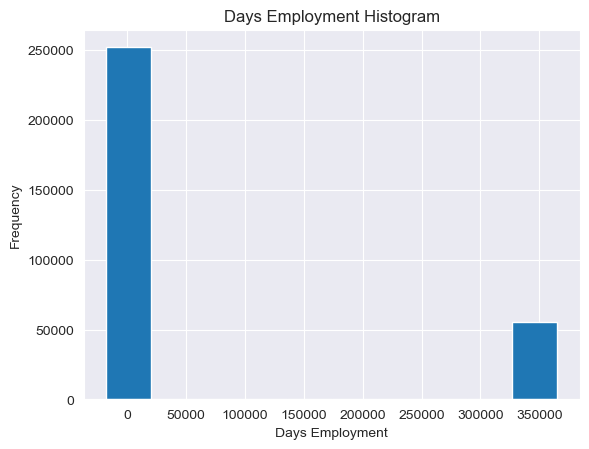

In [18]:
app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

In [19]:
anom = app_train[app_train['DAYS_EMPLOYED'] == 365243]
non_anom = app_train[app_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


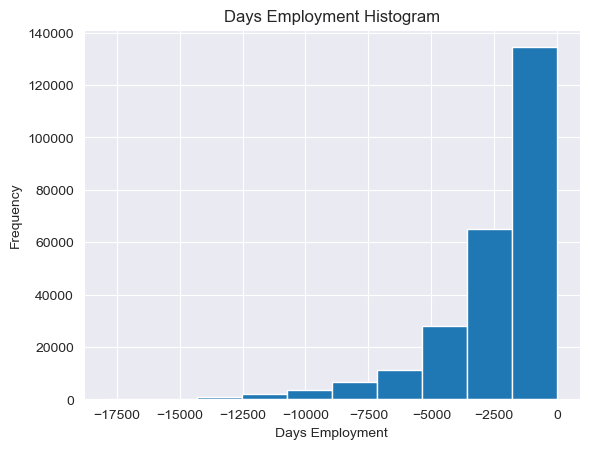

In [20]:
# Create an anomalous flag column
app_train['DAYS_EMPLOYED_ANOM'] = app_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

In [21]:
app_test['DAYS_EMPLOYED_ANOM'] = app_test["DAYS_EMPLOYED"] == 365243
app_test["DAYS_EMPLOYED"].replace({365243: np.nan}, inplace = True)

print('There are %d anomalies in the test data out of %d entries' % (app_test["DAYS_EMPLOYED_ANOM"].sum(), len(app_test)))

There are 9274 anomalies in the test data out of 48744 entries


In [22]:
# Find correlations with the target and sort
correlations = app_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 OCCUPATION_TYPE_Laborers                             0.043019
FLAG_DOCUMENT_3                                      0.044346
REG_CITY_NOT_LIVE_CITY                               0.044395
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
REG_CITY_NOT_WORK_CITY                               0.050994
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
DAYS_LAST_PHONE_CHANGE                               0.055218
NAME_INCOME_TYPE_Working                             0.057481
REGION_RATING_CLIENT                                 0.058899
REGION_RATING_CLIENT_W_CITY                          0.060893
DAYS_EMPLOYED                                        0.074958
DAYS_BIRTH                                           0.078239
TARGET                                               1.000000
Name: TARGET, dtype: float64

Most Negati

In [23]:
# Find the correlation of the positive days since birth and target
app_train['DAYS_BIRTH'] = abs(app_train['DAYS_BIRTH'])
app_train['DAYS_BIRTH'].corr(app_train['TARGET'])

-0.07823930830982712

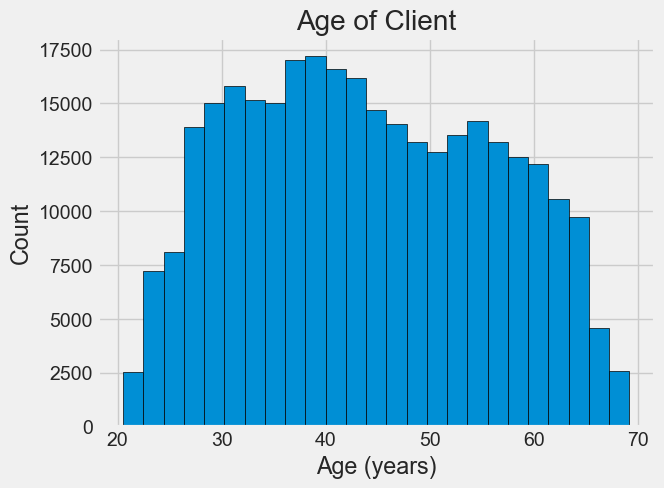

In [24]:
# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(app_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

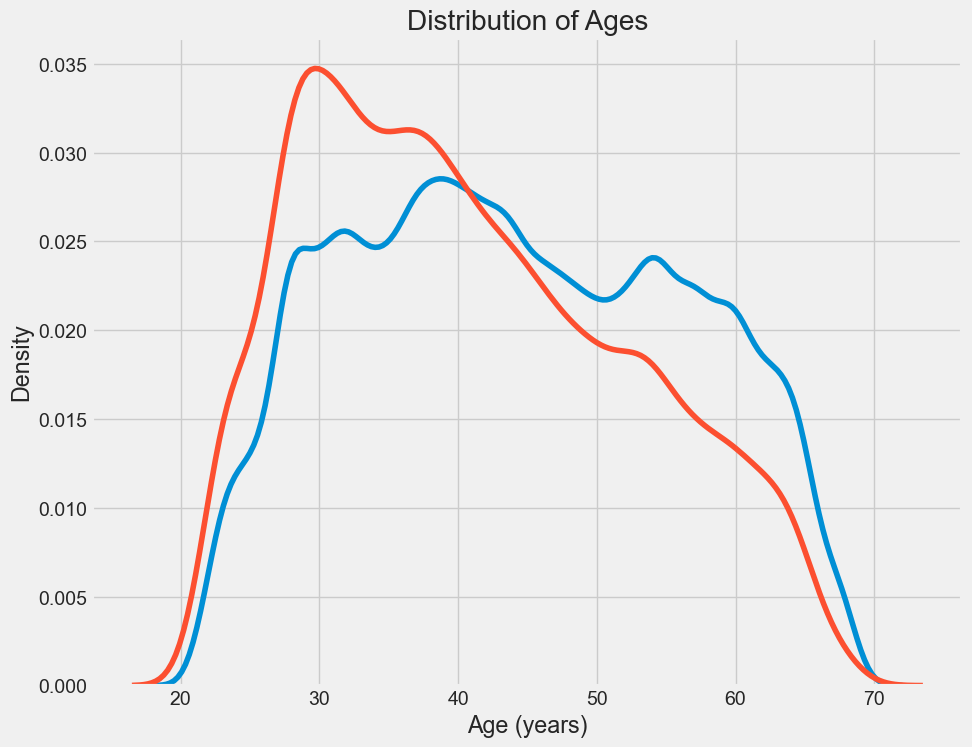

In [25]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

In [26]:
# Age information into a separate dataframe
age_data = app_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [27]:
# Group by the bin and calculate averages
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


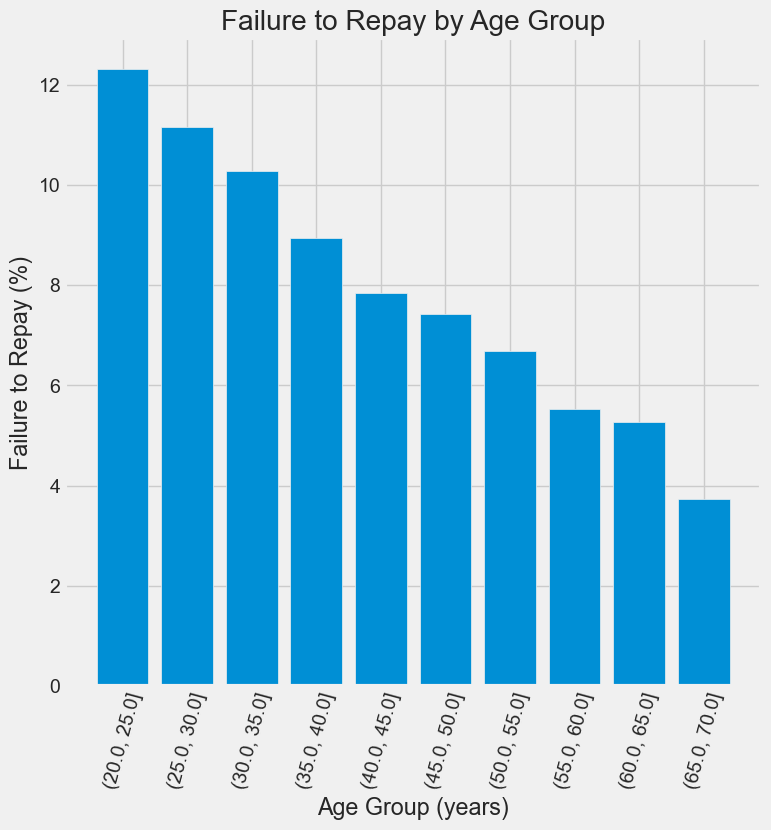

In [28]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

In [29]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = app_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160472,-0.178919,-0.078239
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,0.600610
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,0.091996
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,0.205478
DAYS_BIRTH,-0.078239,0.600610,0.091996,0.205478,1.000000


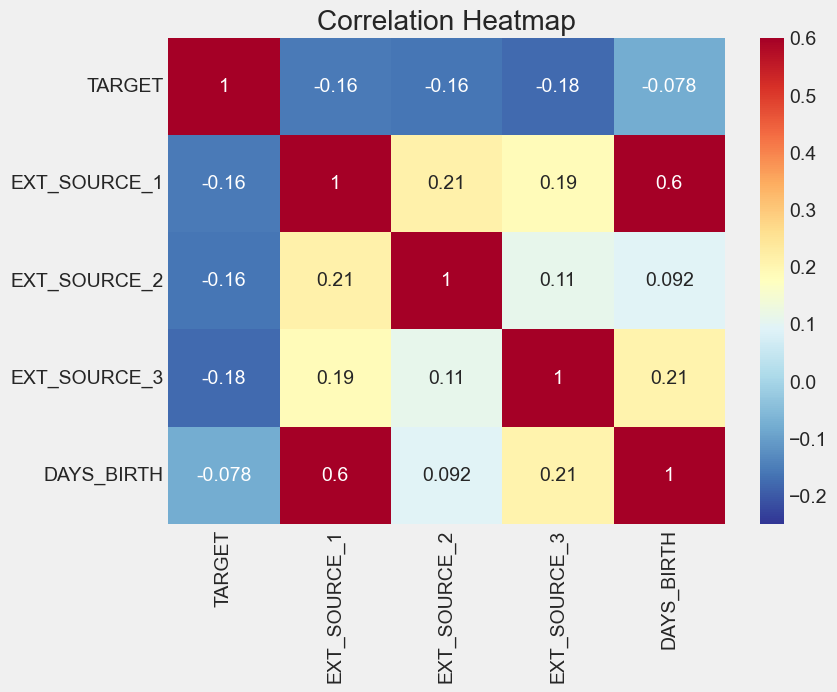

In [30]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

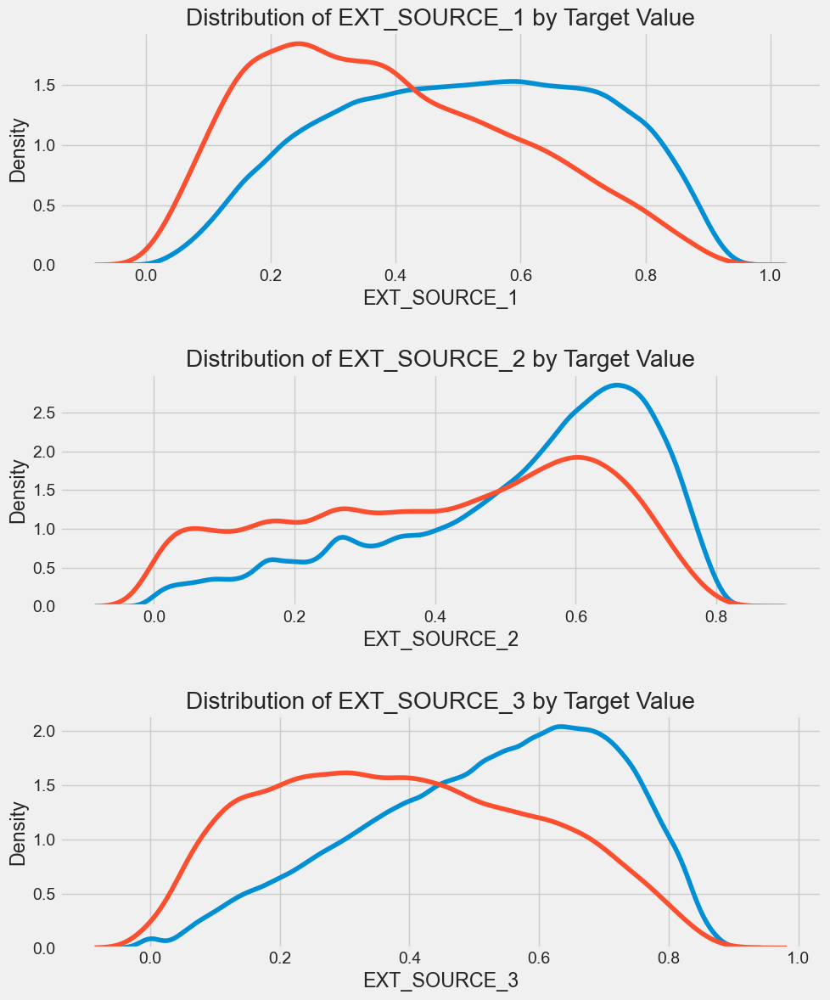

In [31]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):

    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, source], label = 'target == 1')

    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');

plt.tight_layout(h_pad = 2.5)

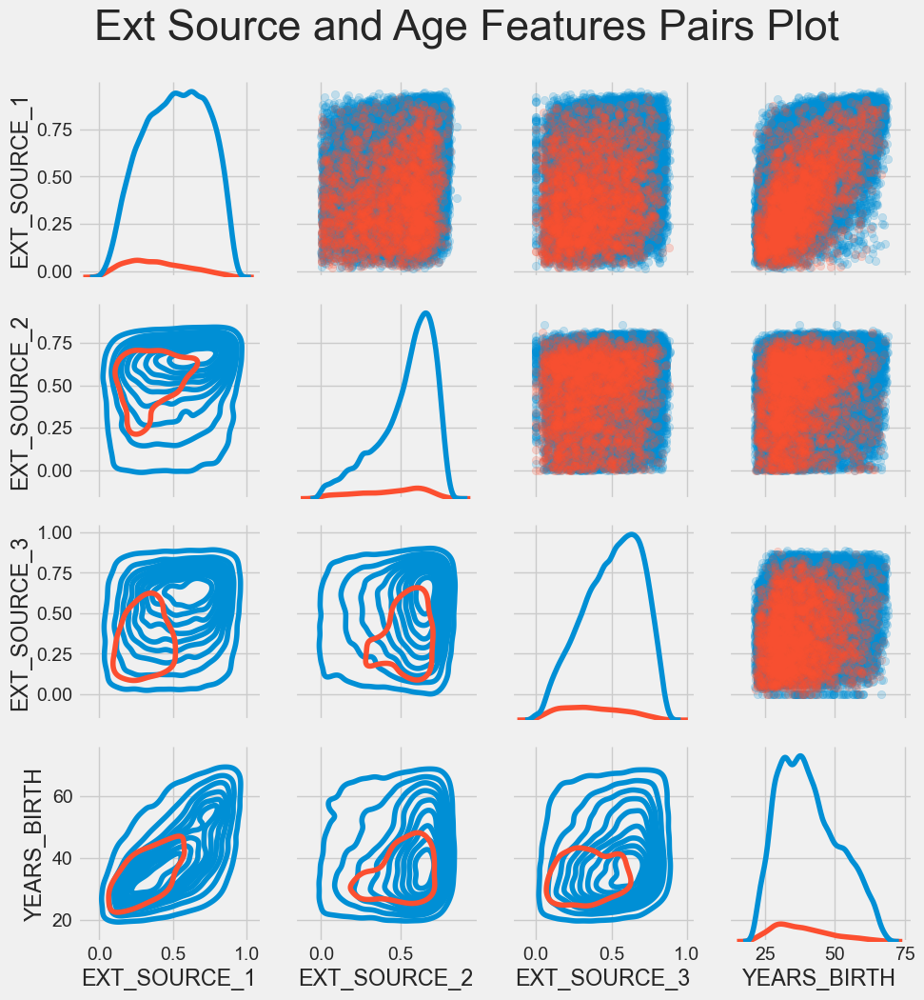

In [32]:
# Copy the data for plotting
plot_data = ext_data.drop(columns = ['DAYS_BIRTH']).copy()

# Add in the age of the client in years
plot_data['YEARS_BIRTH'] = age_data['YEARS_BIRTH']

# Drop na values and limit to first 100000 rows
plot_data = plot_data.dropna().loc[:100000, :]

# Function to calculate correlation coefficient between two columns
def corr_func(x, y, **kwargs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.2, .8), xycoords=ax.transAxes,
                size = 20)

# Create the pairgrid object
grid = sns.PairGrid(data = plot_data, diag_sharey=False,
                    hue = 'TARGET',
                    vars = [x for x in list(plot_data.columns) if x != 'TARGET'])

# Upper is a scatter plot
grid.map_upper(plt.scatter, alpha = 0.2)

# Diagonal is a histogram
grid.map_diag(sns.kdeplot)

# Bottom is density plot
grid.map_lower(sns.kdeplot, cmap = plt.cm.OrRd_r);

plt.suptitle('Ext Source and Age Features Pairs Plot', size = 32, y = 1.05);

In [33]:
app_train_domain = app_train.copy()
app_test_domain = app_test.copy()

app_train_domain['CREDIT_INCOME_PERCENT'] = app_train_domain['AMT_CREDIT'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['ANNUITY_INCOME_PERCENT'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['CREDIT_TERM'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_CREDIT']
app_train_domain['DAYS_EMPLOYED_PERCENT'] = app_train_domain['DAYS_EMPLOYED'] / app_train_domain['DAYS_BIRTH']

In [34]:
app_test_domain['CREDIT_INCOME_PERCENT'] = app_test_domain['AMT_CREDIT'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['ANNUITY_INCOME_PERCENT'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_INCOME_TOTAL']
app_test_domain['CREDIT_TERM'] = app_test_domain['AMT_ANNUITY'] / app_test_domain['AMT_CREDIT']
app_test_domain['DAYS_EMPLOYED_PERCENT'] = app_test_domain['DAYS_EMPLOYED'] / app_test_domain['DAYS_BIRTH']

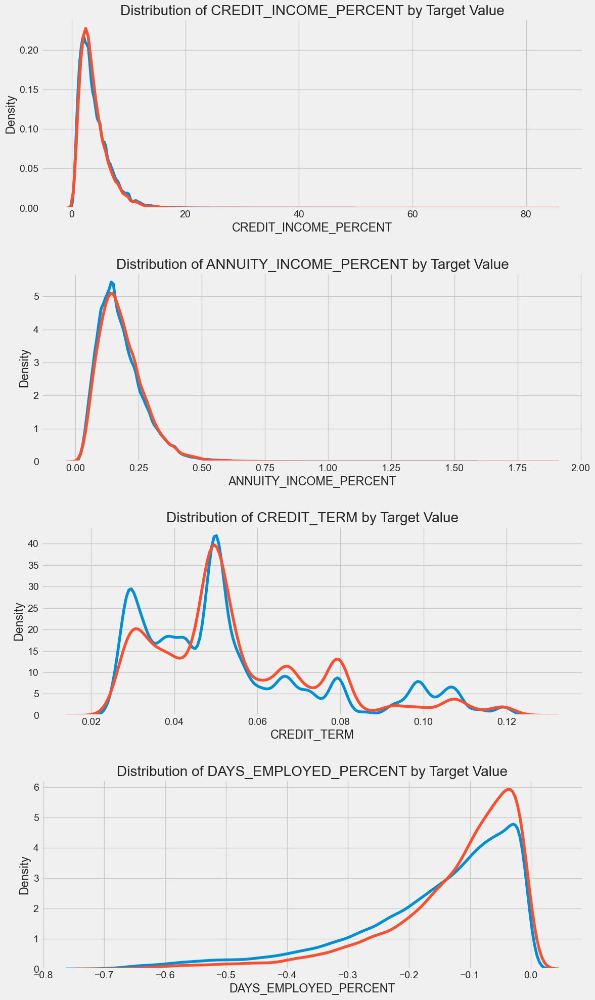

In [35]:
plt.figure(figsize = (12, 20))
# iterate through the new features
for i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):

    # create a new subplot for each source
    plt.subplot(4, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label = 'target == 1')

    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature); plt.ylabel('Density');

plt.tight_layout(h_pad = 2.5)

In [36]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import roc_auc_score

# Optimisation des types de données
def optimize_dataframe(df):
    for col in df.select_dtypes(include=['int64', 'float64']).columns:
        df[col] = df[col].astype('float32')
    return df

app_train = optimize_dataframe(app_train)
app_test = optimize_dataframe(app_test)

id_test = app_test['SK_ID_CURR']

# Drop the target from the training data
if 'TARGET' in app_train:
    train = app_train.drop(columns = ['TARGET'])
else:
    train = app_train.copy()

feature_names = train.columns

imputer = SimpleImputer(strategy = 'median')
imputer.fit(train)
train = imputer.transform(train)
test = imputer.transform(app_test)

scaler = StandardScaler()
train = scaler.fit_transform(train)
X_test = scaler.transform(test)

# Gestion du déséquilibre avec SMOTE
#smote = SMOTE(random_state=42)
#X_train_res, y_train_res = smote.fit_resample(X_train, y_train)
#print("Distribution après SMOTE:")
#print(y_train_res.value_counts())

In [37]:
def seuil_optimal(y_true, y_prob, beta=0.5, pas=0.01):
    seuils = np.arange(0.0, 1.0, pas)
    scores = []
    for seuil in seuils:
        y_pred = (y_prob >= seuil).astype(int)
        score = fbeta_score(y_true, y_pred, beta=beta, average='weighted')
        scores.append(score)
    best_idx = np.argmax(scores)
    return seuils[best_idx], scores[best_idx]

# Définition des modèles et des grilles de recherche
models_params = {
    'Dummy Classifier': (DummyClassifier(strategy='stratified'), {}),
    'Random Forest': (RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1),
                      {'n_estimators': [100], 'max_depth': [5, 10, 20]}),
    'LightGBM': (LGBMClassifier(class_weight='balanced', random_state=42, n_jobs=-1),
                 {'n_estimators': [100], 'learning_rate': [0.05, 0.1, 0.2]})
}

results = {}
feature_importances = {}
predictions = {}

# Fonction pour créer un score F-beta personnalisé
def make_fbeta_scorer(beta):
    return make_scorer(fbeta_score, beta=beta, average='weighted')

# Valeurs de beta à tester
beta_values = [0.5,0.6,0.7]

cv_strategy = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Tester différentes combinaisons de poids pour chaque modèle
for name, (model, model_params) in models_params.items():
    try:
        best_score = None
        best_beta = None
        best_model = None

        # Vérifier que train_labels contient au moins 2 classes
        unique_classes = np.unique(train_labels)
        if len(unique_classes) < 2:
            print(f"⚠️ Skipping {name}: y_train has only one class: {unique_classes}")
            continue

        # Tester différentes valeurs de beta
        for beta in beta_values:
            scorer = make_fbeta_scorer(beta)

            halving_search = HalvingRandomSearchCV(
                model, model_params, factor=2, cv=cv_strategy,
                scoring=scorer, n_jobs=-1, random_state=42, refit=True
            )
            halving_search.fit(train, train_labels)

            if best_score is None or halving_search.best_score_ > best_score:
                best_score = halving_search.best_score_
                best_beta = beta
                best_model = halving_search.best_estimator_

        # Vérification si un modèle a été sélectionné
        if best_model is None:
            print(f"⚠️ Aucun modèle valide trouvé pour {name}, skipping...")
            continue

        # Prédictions
        y_pred = cross_val_predict(best_model, train, train_labels, cv=cv_strategy)
        y_proba = cross_val_predict(best_model, train, train_labels, cv=cv_strategy, method='predict_proba')[:, 1]

        # Recherche du meilleur seuil
        seuil_opt, fbeta_seuil = seuil_optimal(train_labels, y_proba, beta=best_beta, pas=0.01)

        # Prédictions binaires avec ce seuil optimal
        y_pred_opt = (y_proba >= seuil_opt).astype(int)

        # Calcul du F-beta score final
        fbeta_final = fbeta_score(train_labels, y_pred, beta=best_beta, average='weighted')

        # Sauvegarde des résultats
        results[name] = {
            'Best Params': best_model.get_params(),
            'Best Model': best_model,
            'Best Beta': best_beta,
            'AUC-ROC': roc_auc_score(train_labels, y_proba) if y_proba is not None else None,
            'F1-Score': classification_report(train_labels, y_pred, output_dict=True)['weighted avg']['f1-score'],
            'Recall': classification_report(train_labels, y_pred, output_dict=True)['weighted avg']['recall'],
            'Seuil Optimal': seuil_opt,
            'F-beta Score': fbeta_final
        }

        # Démarre un run MLflow pour chaque modèle
        with mlflow.start_run(run_name=name):
            mlflow.set_tag("model_name", name)

            # Logger les hyperparams et scores
            mlflow.log_params(best_model.get_params())
            mlflow.log_metric("best_fbeta", fbeta_final)
            mlflow.log_metric("seuil_optimal", seuil_opt)
            mlflow.log_metric("roc_auc", results[name]['AUC-ROC'])

            # Matrice de confusion
            cm = confusion_matrix(train_labels, y_pred_opt)
            disp = ConfusionMatrixDisplay(confusion_matrix=cm)
            disp.plot(cmap='Blues')
            plt.title(f"Confusion Matrix - {name}")
            cm_filename = f"conf_matrix_{name.replace(' ', '_')}.png"
            plt.savefig(cm_filename)
            plt.close()
            mlflow.log_artifact(cm_filename, artifact_path="confusion_matrices")

            # Logger le modèle entraîné
            mlflow.sklearn.log_model(best_model, artifact_path="model")

            # Supprimer le fichier local après log (optionnel mais propre)
            os.remove(cm_filename)

            if hasattr(best_model, "predict_proba"):
                fpr, tpr, thresholds = roc_curve(train_labels, y_proba)
                roc_auc = auc(fpr, tpr)

                plt.figure()
                plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'AUC = {roc_auc:.2f}')
                plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
                plt.xlabel('False Positive Rate')
                plt.ylabel('True Positive Rate')
                plt.title(f"ROC Curve - {name}")
                plt.legend(loc="lower right")

                roc_filename = f"roc_curve_{name.replace(' ', '_')}.png"
                plt.savefig(roc_filename)
                plt.close()

                mlflow.log_artifact(roc_filename, artifact_path="roc_curves")
                os.remove(roc_filename)

            if hasattr(best_model, "feature_importances_"):
                importances = best_model.feature_importances_

                plt.figure(figsize=(10, 5))
                plt.barh(feature_names, importances)
                plt.xlabel("Importance")
                plt.title(f"Feature Importances - {name}")
                plt.tight_layout()

                featimp_filename = f"feature_importance_{name.replace(' ', '_')}.png"
                plt.savefig(featimp_filename)
                plt.close()

                mlflow.log_artifact(featimp_filename, artifact_path="feature_importances")
                os.remove(featimp_filename)

        # Extraction des importances des features si disponible
        if hasattr(best_model, 'feature_importances_'):
            feature_importances[name] = best_model.feature_importances_

        # Prédictions finales sur le test
        if hasattr(best_model, 'predict_proba'):
            predictions[name] = best_model.predict_proba(X_test)[:, 1]

    except Exception as e:
        print(f"Erreur pour {name} : {e}")

# Affichage des résultats
results_df = pd.DataFrame(results).T
print(results_df)

2025/04/19 12:17:43 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '62e0c1c601a14b26a332185366b88368', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2025/04/19 12:17:43 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'
2025/04/19 12:17:51 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '0ca45640f48846b1b9bd370303611bca', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run vaunted-lynx-735 at: http://localhost:5000/#/experiments/0/runs/62e0c1c601a14b26a332185366b88368
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:17:51 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'
2025/04/19 12:17:56 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'b0deac0f7ec6420488ee5fc4f18a3ed9', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run ambitious-eel-794 at: http://localhost:5000/#/experiments/0/runs/0ca45640f48846b1b9bd370303611bca
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:17:56 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


🏃 View run smiling-hog-948 at: http://localhost:5000/#/experiments/0/runs/b0deac0f7ec6420488ee5fc4f18a3ed9
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:01 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '901d855d056f419b821c0e1da04a3be2', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2025/04/19 12:18:01 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


🏃 View run indecisive-skink-357 at: http://localhost:5000/#/experiments/0/runs/901d855d056f419b821c0e1da04a3be2
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:05 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '74a41ab2e1804721bc4dfdd55af30b98', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2025/04/19 12:18:05 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


🏃 View run luminous-squid-792 at: http://localhost:5000/#/experiments/0/runs/74a41ab2e1804721bc4dfdd55af30b98
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:09 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'd523d824371b44db9b78c0552c9f29b8', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2025/04/19 12:18:09 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


🏃 View run righteous-wolf-669 at: http://localhost:5000/#/experiments/0/runs/d523d824371b44db9b78c0552c9f29b8
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:13 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '17f0eebf263f47e9b8627e4f2aa5f4aa', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run brawny-bug-668 at: http://localhost:5000/#/experiments/0/runs/17f0eebf263f47e9b8627e4f2aa5f4aa
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:17 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '2a179298fddc4b8b87290e06f40f8825', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run omniscient-kit-564 at: http://localhost:5000/#/experiments/0/runs/2a179298fddc4b8b87290e06f40f8825
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:20 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '2fb7577dba8b4aaba024e976626c4f06', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run shivering-stork-175 at: http://localhost:5000/#/experiments/0/runs/2fb7577dba8b4aaba024e976626c4f06
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:30 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2025/04/19 12:18:30 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'a984a3b50f3348e794135d2ab218f129', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run Dummy Classifier at: http://localhost:5000/#/experiments/0/runs/5f97f126c43c49ffb294fbdce9f80444
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:31 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'
2025/04/19 12:18:45 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '4dea5fa5c0c0420689fff09129fe3110', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run silent-hare-363 at: http://localhost:5000/#/experiments/0/runs/a984a3b50f3348e794135d2ab218f129
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:45 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'
2025/04/19 12:18:58 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'c15225343eec41e7a6f2892825edd1f0', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run clean-ray-178 at: http://localhost:5000/#/experiments/0/runs/4dea5fa5c0c0420689fff09129fe3110
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:18:58 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


🏃 View run aged-dove-717 at: http://localhost:5000/#/experiments/0/runs/c15225343eec41e7a6f2892825edd1f0
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:19:10 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'c92db8a6cbeb4f8b844f780b5fbd8d34', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2025/04/19 12:19:10 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


🏃 View run worried-ape-185 at: http://localhost:5000/#/experiments/0/runs/c92db8a6cbeb4f8b844f780b5fbd8d34
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:19:21 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'bb4bb71a77e94781a0f6b409e1915aa9', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2025/04/19 12:19:21 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


🏃 View run angry-ray-307 at: http://localhost:5000/#/experiments/0/runs/bb4bb71a77e94781a0f6b409e1915aa9
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:19:31 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'b6d2b1580604499b89341ac89289e381', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2025/04/19 12:19:31 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


🏃 View run lyrical-stork-719 at: http://localhost:5000/#/experiments/0/runs/b6d2b1580604499b89341ac89289e381
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:19:41 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '707367f294884083be9cc17628c0c7c1', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run likeable-ape-997 at: http://localhost:5000/#/experiments/0/runs/707367f294884083be9cc17628c0c7c1
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:19:52 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'a7ca3175d9e94afdb5be123f25af288a', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run skittish-wasp-876 at: http://localhost:5000/#/experiments/0/runs/a7ca3175d9e94afdb5be123f25af288a
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:20:02 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'b5ac4a83c1414f059832745fff2c9b1c', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run rumbling-shark-299 at: http://localhost:5000/#/experiments/0/runs/b5ac4a83c1414f059832745fff2c9b1c
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:20:19 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
2025/04/19 12:20:20 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '13b9a2b9a6784f40a6ceff820f7bbce7', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run Random Forest at: http://localhost:5000/#/experiments/0/runs/6648a855cd104635a15954e150afe255
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:20:21 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


[LightGBM] [Info] Number of positive: 24825, number of negative: 282686
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.072487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11667
[LightGBM] [Info] Number of data points in the train set: 307511, number of used features: 234
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


2025/04/19 12:20:30 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '103c8cd6979f489c97ce554c4cc4171d', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run mercurial-trout-854 at: http://localhost:5000/#/experiments/0/runs/13b9a2b9a6784f40a6ceff820f7bbce7
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:20:31 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


[LightGBM] [Info] Number of positive: 24825, number of negative: 282686
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.062475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11667
[LightGBM] [Info] Number of data points in the train set: 307511, number of used features: 234
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000


2025/04/19 12:20:41 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '1016ec81ccb74bfeb1c3d755f84fffb7', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow


🏃 View run popular-stag-21 at: http://localhost:5000/#/experiments/0/runs/103c8cd6979f489c97ce554c4cc4171d
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:20:41 WARNING mlflow.sklearn: Failed to log training dataset information to MLflow Tracking. Reason: 'Series' object has no attribute 'flatten'


[LightGBM] [Info] Number of positive: 24825, number of negative: 282686
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.082670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11667
[LightGBM] [Info] Number of data points in the train set: 307511, number of used features: 234
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
🏃 View run unruly-fish-696 at: http://localhost:5000/#/experiments/0/runs/1016ec81ccb74bfeb1c3d755f84fffb7
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:20:51 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '41ae9eb8faa04fb99ab72c7ac66442fd', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current lightgbm workflow


[LightGBM] [Info] Number of positive: 16550, number of negative: 188457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050532 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11666
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 231
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
🏃 View run colorful-koi-825 at: http://localhost:5000/#/experiments/0/runs/41ae9eb8faa04fb99ab72c7ac66442fd
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:20:58 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '39a4d4375f1c4361b0be8a2060753617', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current lightgbm workflow


[LightGBM] [Info] Number of positive: 16550, number of negative: 188457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11668
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 231
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
🏃 View run redolent-shrew-560 at: http://localhost:5000/#/experiments/0/runs/39a4d4375f1c4361b0be8a2060753617
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:21:05 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '308e89fd137742da86b955ce75a289cb', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current lightgbm workflow


[LightGBM] [Info] Number of positive: 16550, number of negative: 188458
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055999 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11681
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 232
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
🏃 View run redolent-mole-180 at: http://localhost:5000/#/experiments/0/runs/308e89fd137742da86b955ce75a289cb
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:21:13 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '550fa7872be140c0a9ed9cbb0be240b1', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current lightgbm workflow


[LightGBM] [Info] Number of positive: 16550, number of negative: 188457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050639 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11666
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 231
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
🏃 View run clean-fawn-683 at: http://localhost:5000/#/experiments/0/runs/550fa7872be140c0a9ed9cbb0be240b1
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:21:20 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '5803a19282d741ae8f870386c761c40c', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current lightgbm workflow


[LightGBM] [Info] Number of positive: 16550, number of negative: 188457
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053668 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11668
[LightGBM] [Info] Number of data points in the train set: 205007, number of used features: 231
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
🏃 View run ambitious-conch-588 at: http://localhost:5000/#/experiments/0/runs/5803a19282d741ae8f870386c761c40c
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:21:28 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'eb3d20460e2e4fdea99fbfb142b55a91', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current lightgbm workflow


[LightGBM] [Info] Number of positive: 16550, number of negative: 188458
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11681
[LightGBM] [Info] Number of data points in the train set: 205008, number of used features: 232
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
🏃 View run incongruous-lamb-407 at: http://localhost:5000/#/experiments/0/runs/eb3d20460e2e4fdea99fbfb142b55a91
🧪 View experiment at: http://localhost:5000/#/experiments/0


2025/04/19 12:21:41 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run LightGBM at: http://localhost:5000/#/experiments/0/runs/114943e6ca1a4654821d32629c333f0b
🧪 View experiment at: http://localhost:5000/#/experiments/0
                                                        Best Params  \
Dummy Classifier  {'constant': None, 'random_state': None, 'stra...   
Random Forest     {'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...   
LightGBM          {'boosting_type': 'gbdt', 'class_weight': 'bal...   

                                                         Best Model Best Beta  \
Dummy Classifier             DummyClassifier(strategy='stratified')       0.5   
Random Forest     (DecisionTreeClassifier(max_depth=10, max_feat...       0.7   
LightGBM          LGBMClassifier(class_weight='balanced', n_jobs...       0.7   

                   AUC-ROC  F1-Score    Recall Seuil Optimal F-beta Score  
Dummy Classifier  0.501519  0.851821  0.851713          0.01     0.851887  
Random Forest     0.724099  0.782791  0.721958          0.65     0.815113  
Li

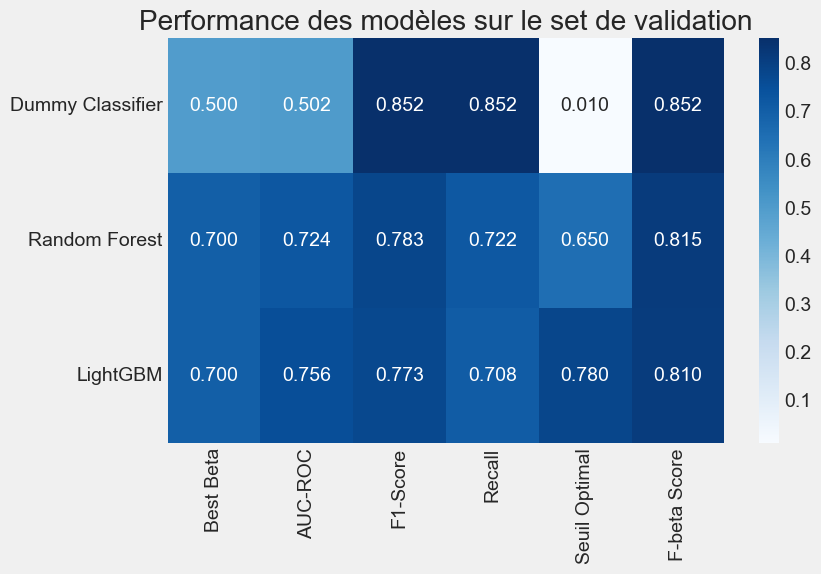

In [38]:
# Visualisation des scores
plt.figure(figsize=(8, 5))

for col in results_df.drop(columns=['Best Params','Best Model']).select_dtypes(include=['object']).columns:
    results_df[col] = results_df[col].astype('float32')

sns.heatmap(results_df.drop(columns=['Best Params','Best Model']), annot=True, cmap='Blues', fmt='.3f')
plt.title('Performance des modèles sur le set de validation')
plt.show()

In [39]:
# Trier les modèles d'abord par AUC-ROC (descendant) puis F-beta Score (descendant)
best_model_name = sorted(results.keys(), key=lambda x: (-results[x]['AUC-ROC'], -results[x]['F-beta Score']))[0]
best_model = models_params[best_model_name][0]

if not hasattr(best_model, "booster_"):
    print("⏳ Entraînement du meilleur modèle...")
    best_model.fit(train, train_labels)
    print("✅ Entraînement terminé.")

# Sauvegarde du modèle
joblib.dump(best_model, 'best_model.pkl')
joblib.dump(scaler, 'scaler.pkl')

# Sauvegarde du dataframe de test
test = pd.DataFrame(test, columns=feature_names)
joblib.dump(test, 'df_test.pkl')

print(f"✅ Modèle sélectionné : {best_model_name} (sauvegardé sous 'best_model.pkl')")

2025/04/19 12:21:43 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '248cdaecc09d4317a5d9ffc960db762f', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current lightgbm workflow


⏳ Entraînement du meilleur modèle...
[LightGBM] [Info] Number of positive: 24825, number of negative: 282686
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.077730 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11667
[LightGBM] [Info] Number of data points in the train set: 307511, number of used features: 234
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Start training from score 0.000000
🏃 View run intrigued-mare-959 at: http://localhost:5000/#/experiments/0/runs/248cdaecc09d4317a5d9ffc960db762f
🧪 View experiment at: http://localhost:5000/#/experiments/0
✅ Entraînement terminé.
✅ Modèle sélectionné : LightGBM (sauvegardé sous 'best_model.pkl')


In [40]:
# Sauvegarde des prédictions finales
predictions_df = pd.DataFrame(predictions)
predictions_df.to_csv('predictions.csv', index=False)
print("Les prédictions ont été sauvegardées dans 'predictions.csv'")

Les prédictions ont été sauvegardées dans 'predictions.csv'


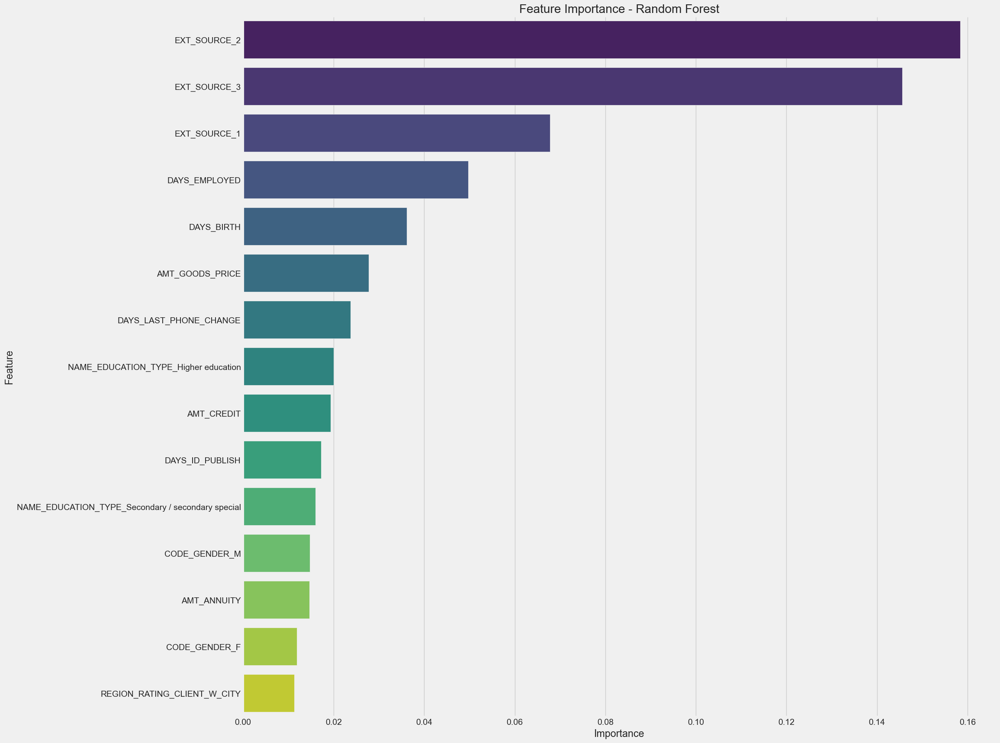

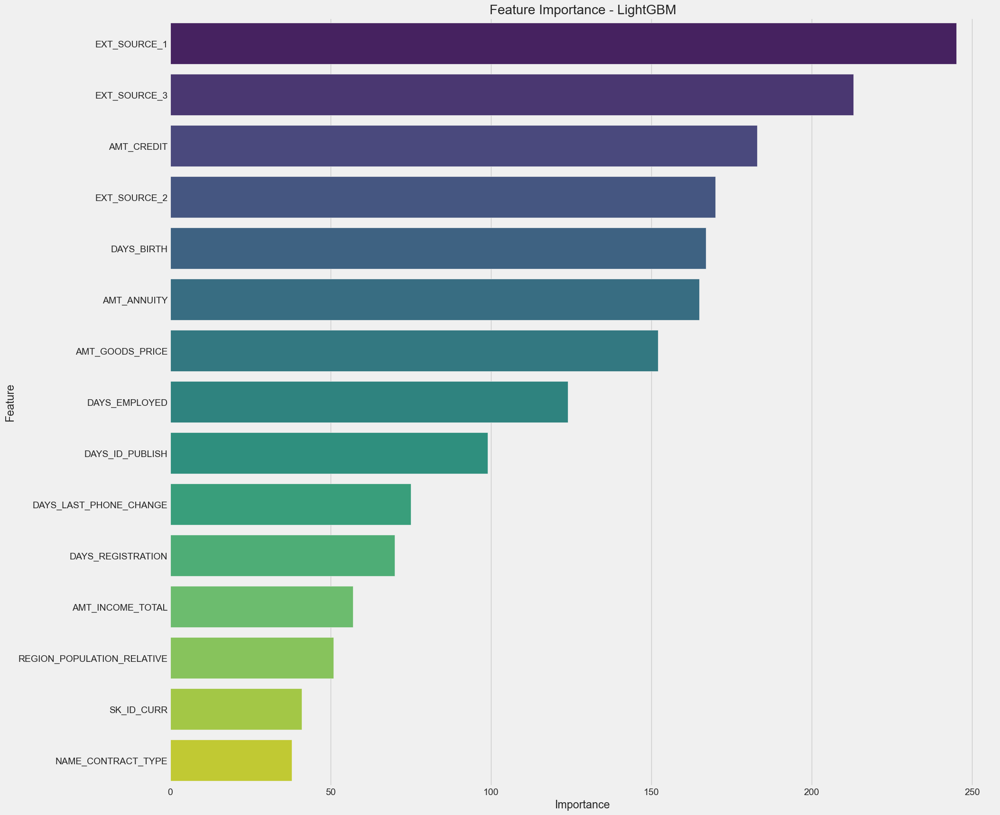

In [41]:
# Visualisation des importances des features
for name, importance in feature_importances.items():
    plt.figure(figsize=(20, 20))
    importance_df = pd.DataFrame({'Feature': feature_names[:len(importance)], 'Importance': importance})
    importance_df = importance_df.sort_values(by='Importance', ascending=False).head(15)
    sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')
    plt.title(f'Feature Importance - {name}')
    plt.show()

In [42]:
import psutil
print(f"Utilisation de la RAM après entraînement: {psutil.virtual_memory().available / (1024**3):.2f} GB disponibles")


Utilisation de la RAM après entraînement: 9.93 GB disponibles


In [43]:
import gc
gc.collect()

84107

In [44]:
data_drift_report = Report(metrics=[DataDriftPreset(),])
X_train_drift = pd.DataFrame(train, columns=feature_names)
X_test_drift = pd.DataFrame(X_test, columns=feature_names)

data_drift_report.run(current_data=X_test_drift, reference_data=X_train_drift,column_mapping=None)
data_drift_report

In [45]:
data_drift_report.save_html("DataDriftReport.html")

In [46]:
results_df

,Best Params,Best Model,Best Beta,AUC-ROC,F1-Score,Recall,Seuil Optimal,F-beta Score
Dummy Classifier,"{'constant': None, 'random_state': None, 'stra...",DummyClassifier(strategy='stratified'),0.5,0.501519,0.851821,0.851713,0.01,0.851887
Random Forest,"{'bootstrap': True, 'ccp_alpha': 0.0, 'class_w...","(DecisionTreeClassifier(max_depth=10, max_feat...",0.7,0.724099,0.782791,0.721958,0.65,0.815113
LightGBM,"{'boosting_type': 'gbdt', 'class_weight': 'bal...","LGBMClassifier(class_weight='balanced', n_jobs...",0.7,0.755587,0.773417,0.708173,0.78,0.810060
